In [ ]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Video segmentation with SAM 2

This notebook shows how to use SAM 2 for interactive segmentation in videos. It will cover the following:

- adding clicks (or box) on a frame to get and refine _masklets_ (spatio-temporal masks)
- propagating clicks (or box) to get _masklets_ throughout the video
- segmenting and tracking multiple objects at the same time

We use the terms _segment_ or _mask_ to refer to the model prediction for an object on a single frame, and _masklet_ to refer to the spatio-temporal masks across the entire video. 

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/video_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [1]:
using_colab = False

In [2]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p videos
    !wget -P videos https://dl.fbaipublicfiles.com/segment_anything_2/assets/bedroom.zip
    !unzip -d videos videos/bedroom.zip

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up

In [12]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [13]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


### Loading the SAM 2 video predictor

In [14]:
from sam2.build_sam import build_sam2_video_predictor_with_lora

sam2_checkpoint = "../output_1112_sam2.1_hiera_l_hels_finetune+lora/checkpoints/checkpoint_300.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

# 使用 LoRA 版本的 video predictor
# 可以根据需要调整 LoRA 参数
predictor = build_sam2_video_predictor_with_lora(
    model_cfg, 
    sam2_checkpoint, 
    device=device,
    lora_rank=8,  # LoRA 的秩
    lora_dropout=0.1,  # LoRA dropout
    lora_target_modules=("qkv", "proj"),  # LoRA 应用的目标模块
)

In [6]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

#### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like `<frame_index>.jpg`.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from `00000.jpg`.

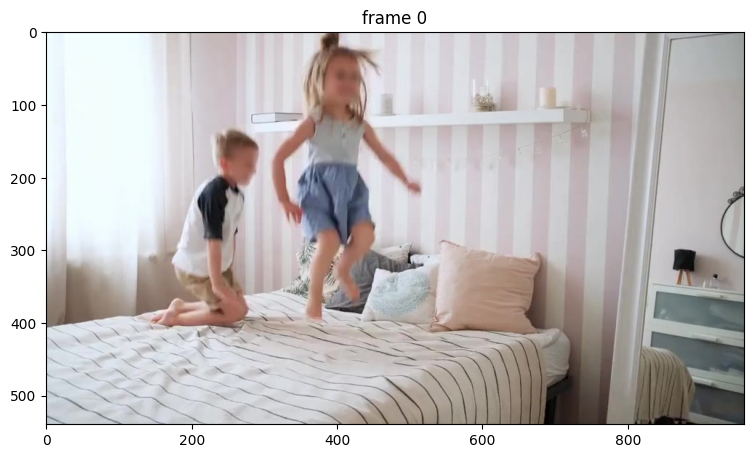

In [7]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "./videos/bedroom"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

#### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video.

During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state` (as shown in the progress bar below).

In [8]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|███████████████████████████████████████████████████████████████████████████████████| 200/200 [00:07<00:00, 26.55it/s]


### Example 1: Segment & track one object

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

(The cell below is just for illustration; it's not needed to call `reset_state` here as this `inference_state` is just freshly initialized above.)

In [9]:
predictor.reset_state(inference_state)

#### Step 1: Add a first click on a frame

To get started, let's try to segment the child on the left.

Here we make a **positive click** at (x, y) = (210, 350) with label `1`, by sending their coordinates and labels into the `add_new_points_or_box` API.

Note: label `1` indicates a *positive click (to add a region)* while label `0` indicates a *negative click (to remove a region)*.

/opt/data/private/hyp/sam2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/opt/data/private/hyp/sam2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


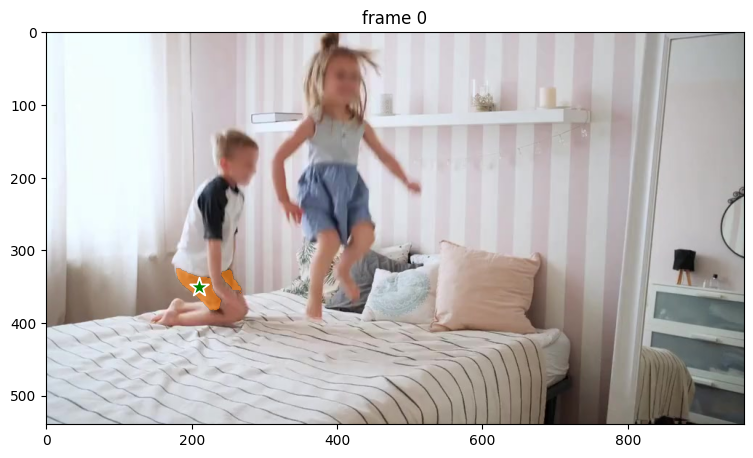

In [10]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (210, 350) to get started
points = np.array([[210, 350]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 2: Add a second click to refine the prediction

Hmm, it seems that although we wanted to segment the child on the left, the model predicts the mask for only the shorts -- this can happen since there is ambiguity from a single click about what the target object should be. We can refine the mask on this frame via another positive click on the child's shirt.

Here we make a **second positive click** at (x, y) = (250, 220) with label `1` to expand the mask.

Note: we need to send **all the clicks and their labels** (i.e. not just the last click) when calling `add_new_points_or_box`.

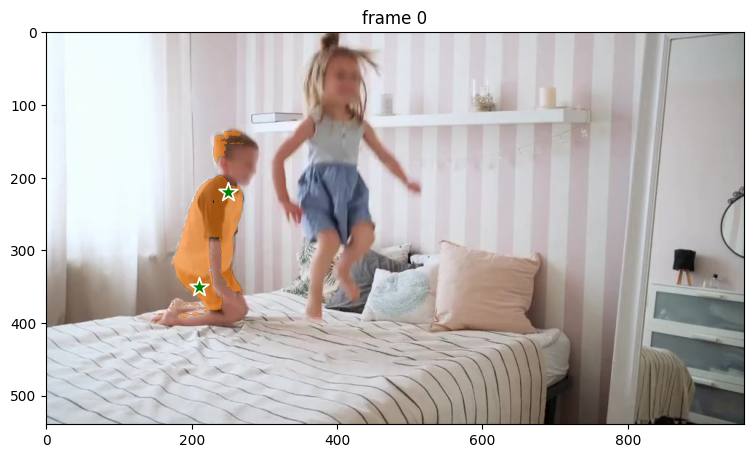

In [11]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd positive click at (x, y) = (250, 220) to refine the mask
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[210, 350], [250, 220]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

With this 2nd refinement click, now we get a segmentation mask of the entire child on frame 0.

#### Step 3: Propagate the prompts to get the masklet across the video

To get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video: 100%|█████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:10<00:00, 19.56it/s]


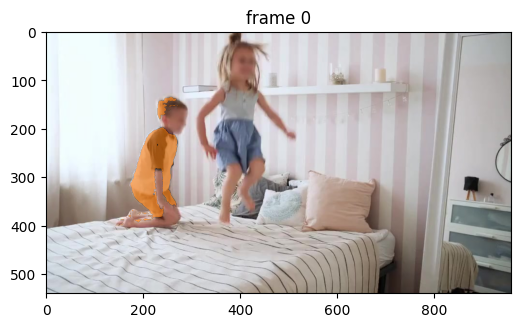

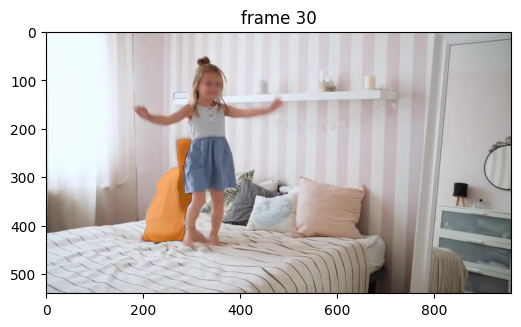

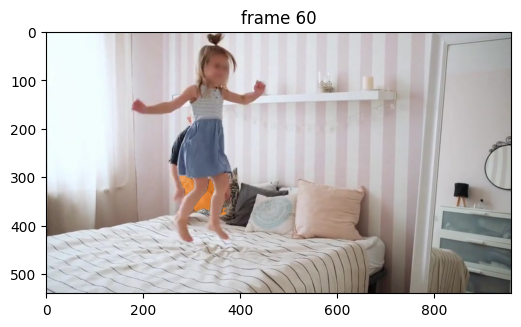

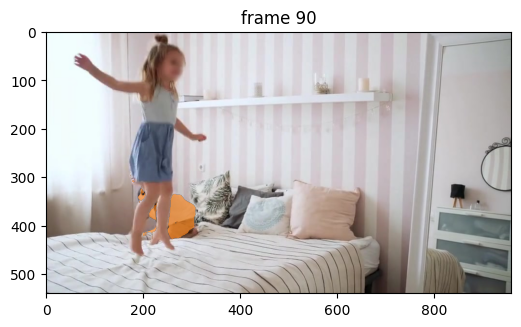

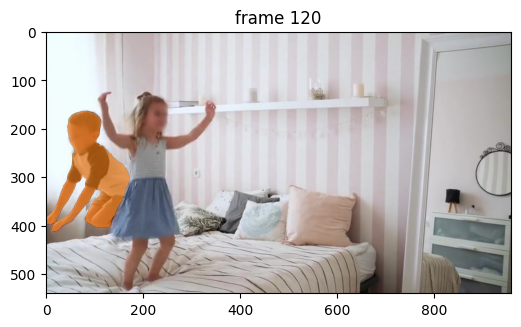

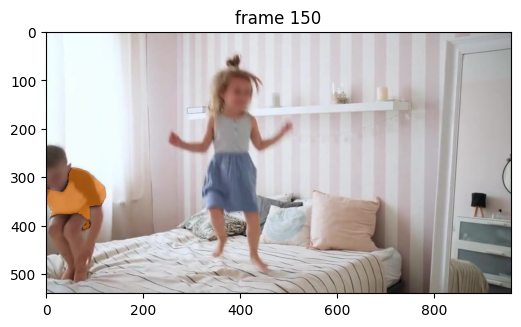

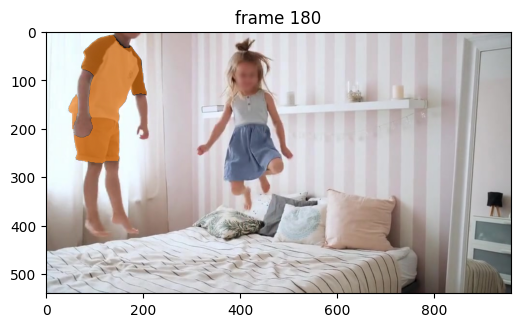

In [12]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

#### Step 4: Add new prompts to further refine the masklet

It appears that in the output masklet above, there are some small imperfections in boundary details on frame 150.

With SAM 2 we can fix the model predictions interactively. We can add a **negative click** at (x, y) = (82, 415) on this frame with label `0` to refine the masklet. Here we call the `add_new_points_or_box` API with a different `frame_idx` argument to indicate the frame index we want to refine.

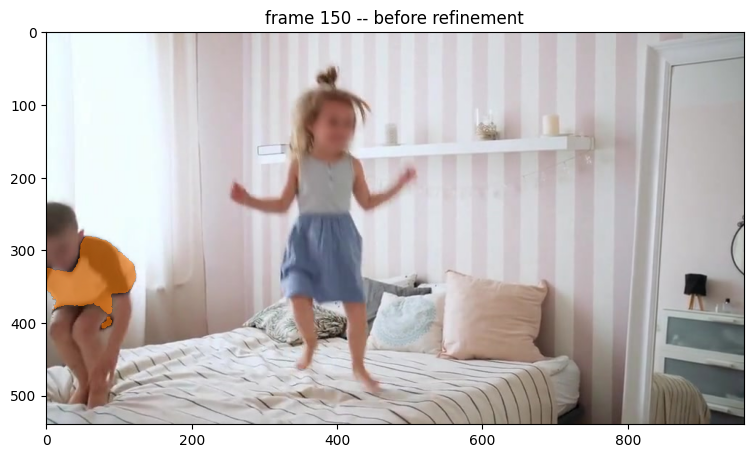

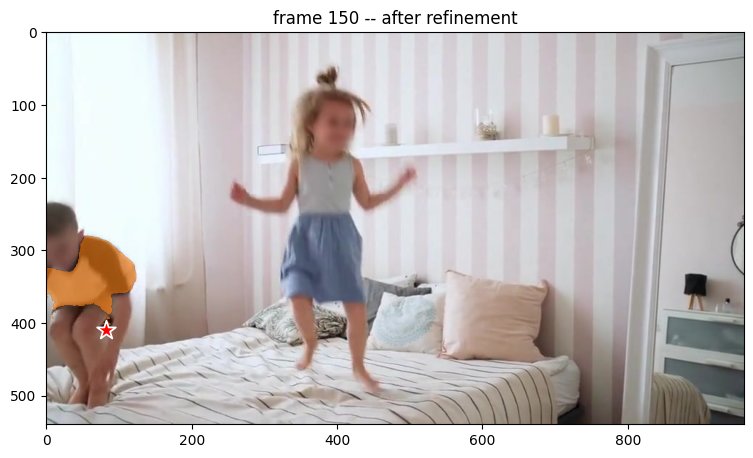

In [13]:
ann_frame_idx = 150  # further refine some details on this frame
ann_obj_id = 1  # give a unique id to the object we interact with (it can be any integers)

# show the segment before further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- before refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_mask(video_segments[ann_frame_idx][ann_obj_id], plt.gca(), obj_id=ann_obj_id)

# Let's add a negative click on this frame at (x, y) = (82, 415) to refine the segment
points = np.array([[82, 410]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([0], np.int32)
_, _, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the segment after the further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- after refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits > 0.0).cpu().numpy(), plt.gca(), obj_id=ann_obj_id)

#### Step 5: Propagate the prompts (again) to get the masklet across the video

Let's get an updated masklet for the entire video. Here we call `propagate_in_video` again to propagate all the prompts after adding the new refinement click above.

propagate in video: 100%|█████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:09<00:00, 20.23it/s]


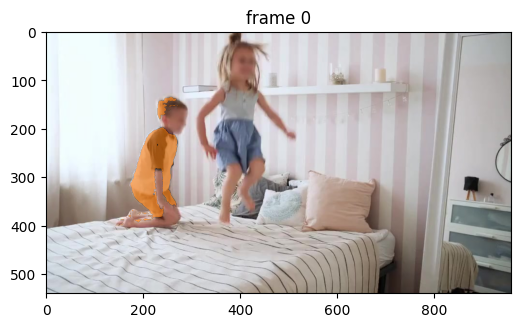

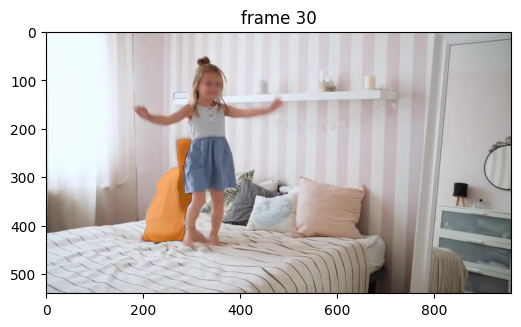

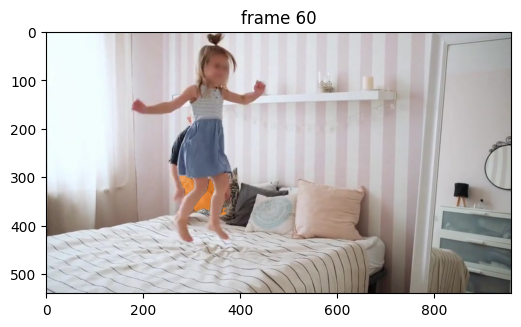

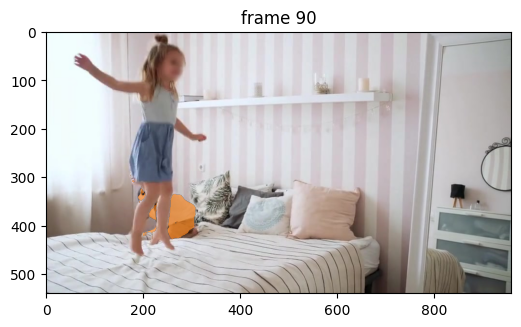

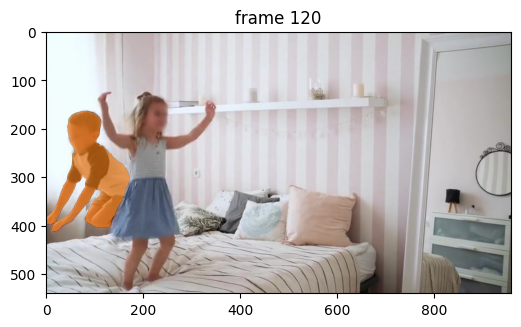

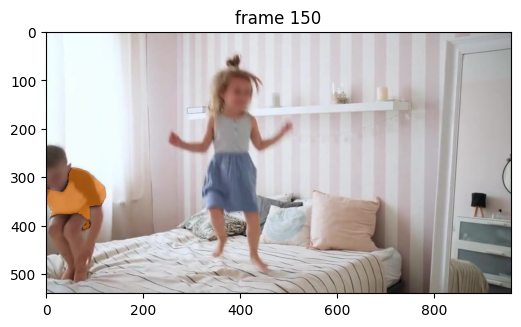

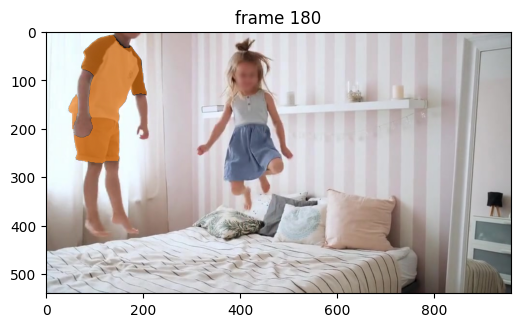

In [14]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

The segments now look good on all frames.

### Example 2: Segment an object using box prompt

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [15]:
predictor.reset_state(inference_state)

In addition to using clicks as inputs, SAM 2 also supports segmenting and tracking objects in a video via **bounding boxes**.

In the example below, we segment the child on the right using a **box prompt** of (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) on frame 0 as input into the `add_new_points_or_box` API.

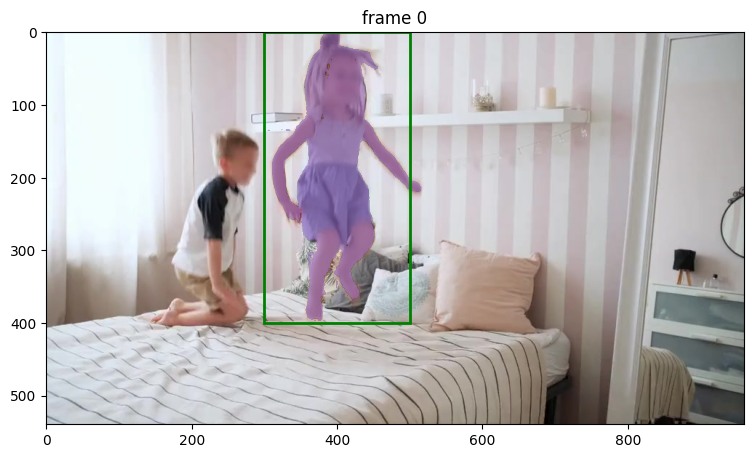

In [16]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a box at (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) to get started
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Here, SAM 2 gets a pretty good segmentation mask of the entire child, even though the input bounding box is not perfectly tight around the object.

Similar to the previous example, if the returned mask from is not perfect when using a box prompt, we can also further **refine** the output using positive or negative clicks. To illustrate this, here we make a **positive click** at (x, y) = (460, 60) with label `1` to expand the segment around the child's hair.

Note: to refine the segmentation mask from a box prompt, we need to send **both the original box input and all subsequent refinement clicks and their labels** when calling `add_new_points_or_box`.

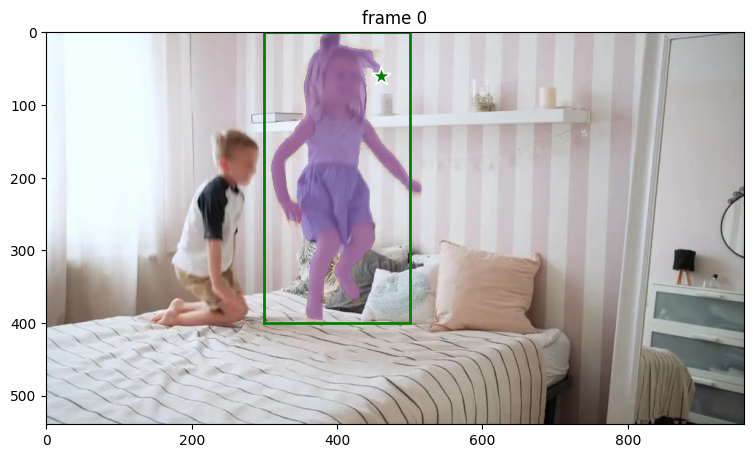

In [17]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (460, 60) to refine the mask
points = np.array([[460, 60]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
# note that we also need to send the original box input along with
# the new refinement click together into `add_new_points_or_box`
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Then, to get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video: 100%|█████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:09<00:00, 20.27it/s]


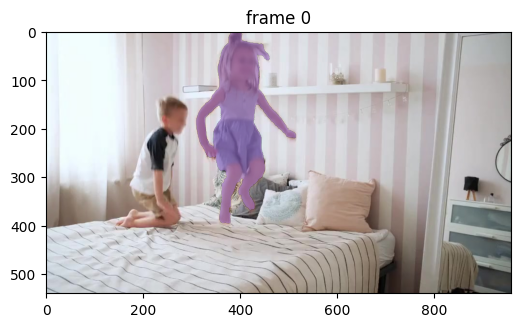

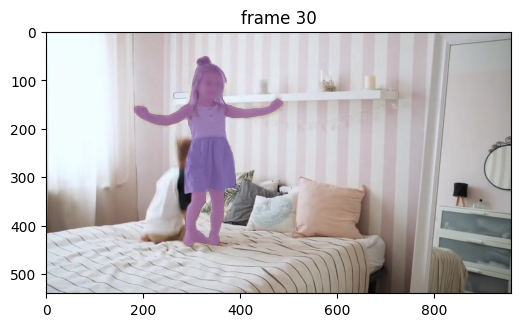

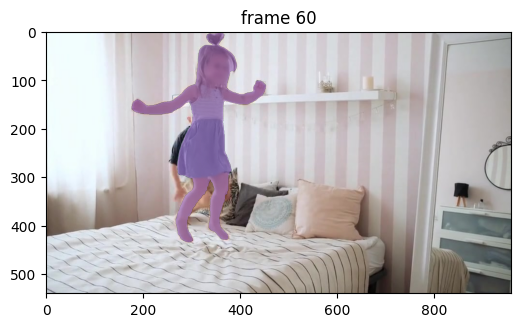

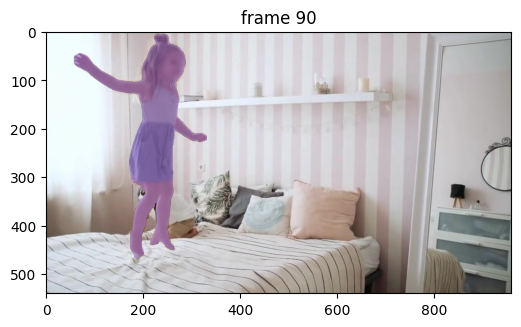

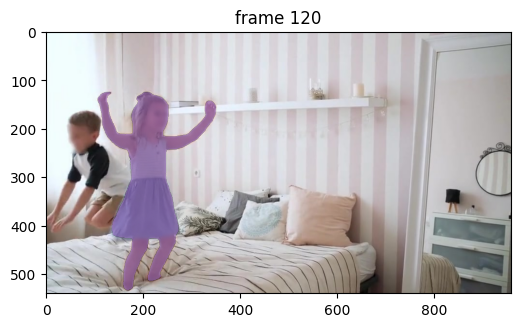

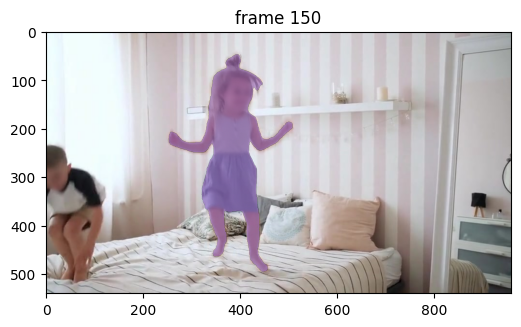

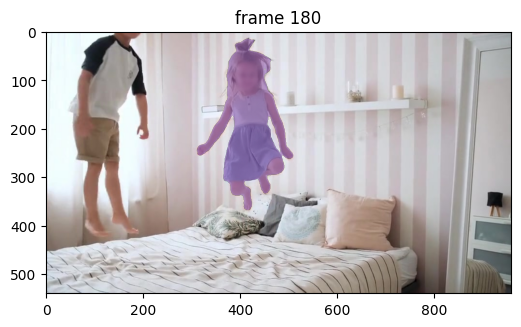

In [18]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Note that in addition to clicks or boxes, SAM 2 also supports directly using a **mask prompt** as input via the `add_new_mask` method in the `SAM2VideoPredictor` class. This can be helpful in e.g. semi-supervised VOS evaluations (see [tools/vos_inference.py](https://github.com/facebookresearch/sam2/blob/main/tools/vos_inference.py) for an example).

### Example 3: Segment multiple objects simultaneously

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [19]:
predictor.reset_state(inference_state)

#### Step 1: Add two objects on a frame

SAM 2 can also segment and track two or more objects at the same time. One way, of course, is to do them one by one. However, it would be more efficient to batch them together (e.g. so that we can share the image features between objects to reduce computation costs).

This time, let's focus on object parts and segment **the shirts of both childen** in this video. Here we add prompts for these two objects and assign each of them a unique object id.

In [20]:
prompts = {}  # hold all the clicks we add for visualization

Add the first object (the left child's shirt) with a **positive click** at (x, y) = (200, 300) on frame 0.

We assign it to object id `2` (it can be arbitrary integers, and only needs to be unique for each object to track), which is passed to the `add_new_points_or_box` API to distinguish the object we are clicking upon.

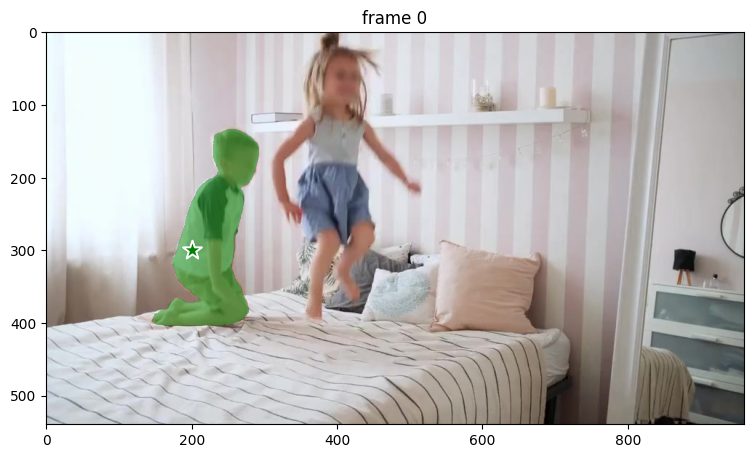

In [21]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (200, 300) to get started on the first object
points = np.array([[200, 300]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

Hmm, this time we just want to select the child's shirt, but the model predicts the mask for the entire child. Let's refine the prediction with a **negative click** at (x, y) = (275, 175).

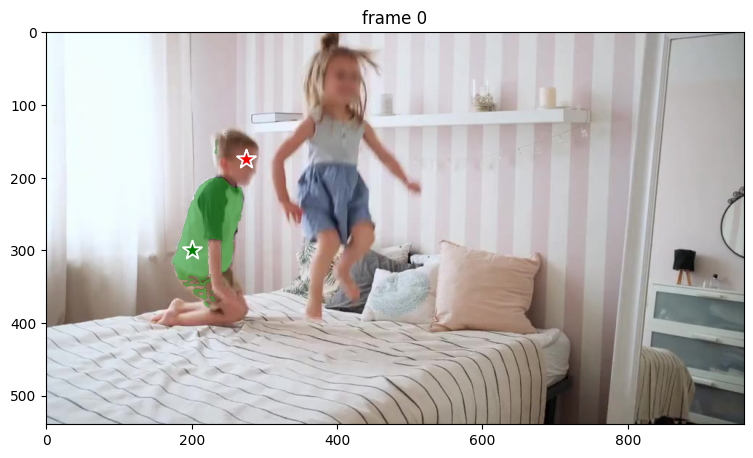

In [22]:
# add the first object
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd negative click at (x, y) = (275, 175) to refine the first object
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[200, 300], [275, 175]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 0], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

After the 2nd negative click, now we get the left child's shirt as our first object.

Let's move on to the second object (the right child's shirt) with a positive click at (x, y) = (400, 150) on frame 0. Here we assign object id `3` to this second object (it can be arbitrary integers, and only needs to be unique for each object to track).

Note: when there are multiple objects, the `add_new_points_or_box` API will return a list of masks for each object.

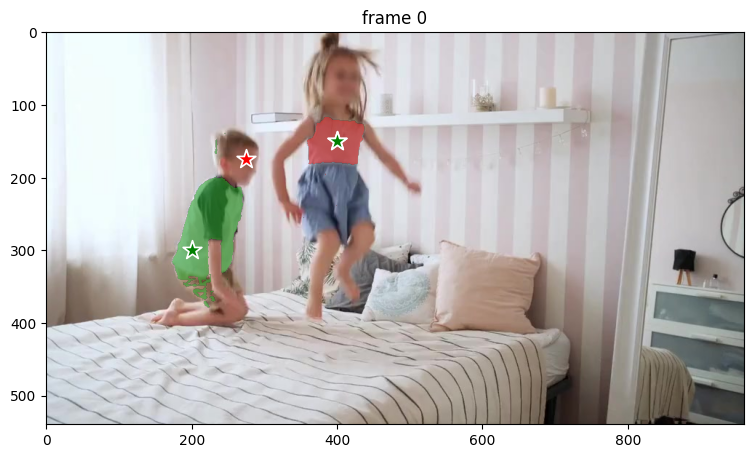

In [23]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 3  # give a unique id to each object we interact with (it can be any integers)

# Let's now move on to the second object we want to track (giving it object id `3`)
# with a positive click at (x, y) = (400, 150)
points = np.array([[400, 150]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels

# `add_new_points_or_box` returns masks for all objects added so far on this interacted frame
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame on all objects
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

This time the model predicts the mask of the shirt we want to track in just one click. Nice!

#### Step 2: Propagate the prompts to get masklets across the video

Now, we propagate the prompts for both objects to get their masklets throughout the video.

Note: when there are multiple objects, the `propagate_in_video` API will return a list of masks for each object.

propagate in video: 100%|█████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:12<00:00, 15.69it/s]


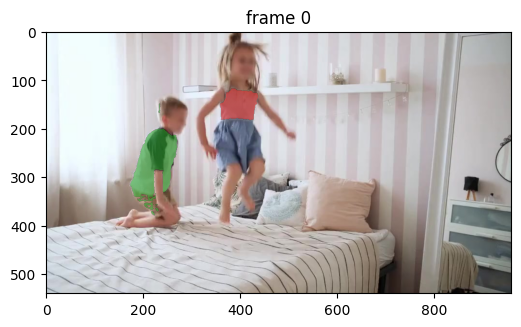

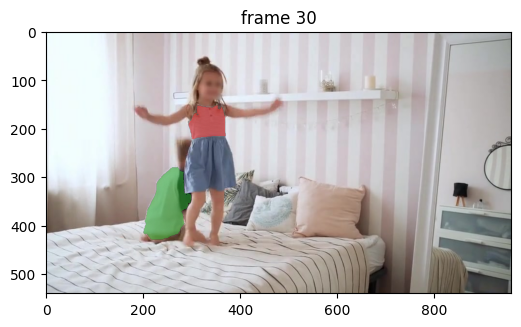

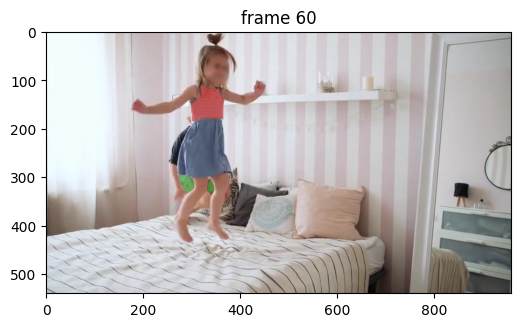

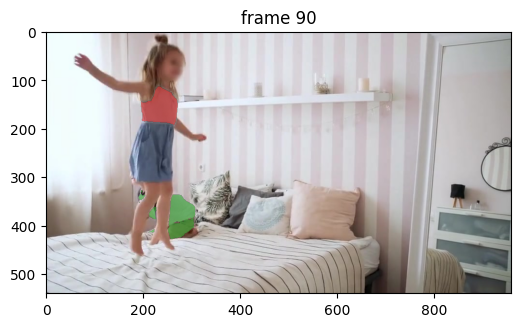

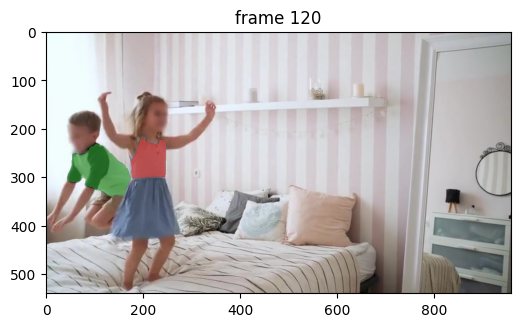

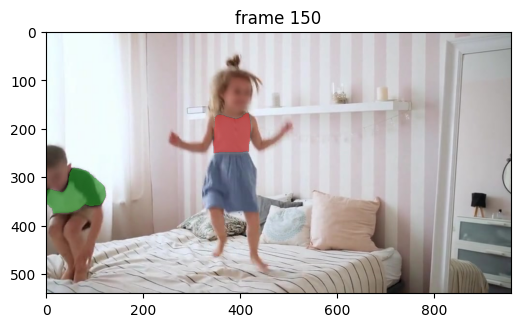

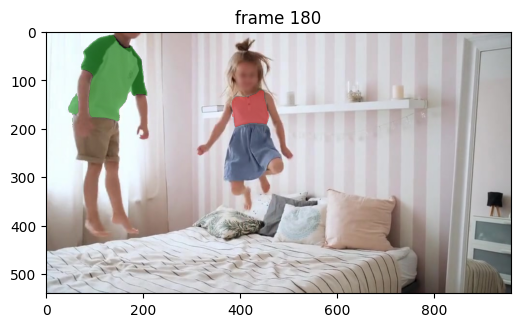

In [24]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Looks like both children's shirts are well segmented in this video.

Now you can try SAM 2 on your own videos and use cases! 

## Bone Image Segmentation Test

Now let's test the LoRA-enabled SAM2 video predictor on bone CT images.

Found 30 bone CT frames


(-0.5, 511.5, 511.5, -0.5)

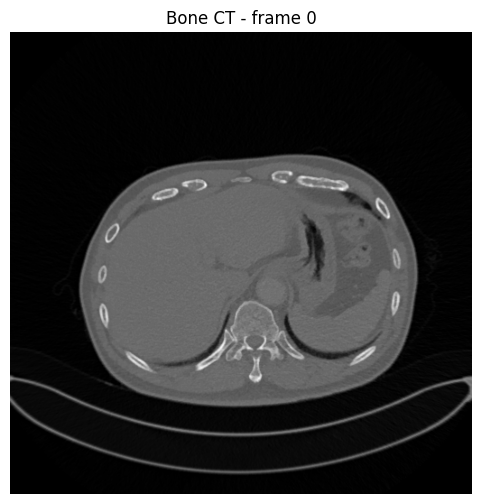

In [25]:
# Load bone CT image sequence！！！！！！！！
bone_video_dir = "/opt/data/private/hyp/sam2/notebooks/videos/bone_yanghailin_12"

# Scan all the PNG frame names
bone_frame_names = [
    p for p in os.listdir(bone_video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG", ".png", ".PNG"]
]
bone_frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

print(f"Found {len(bone_frame_names)} bone CT frames")

# Display the first frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"Bone CT - frame {frame_idx}")
plt.imshow(Image.open(os.path.join(bone_video_dir, bone_frame_names[frame_idx])), cmap='gray')
plt.axis('off')

In [26]:
# Initialize inference state for bone CT video
bone_inference_state = predictor.init_state(video_path=bone_video_dir)

frame loading (JPEG): 100%|█████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:01<00:00, 17.65it/s]


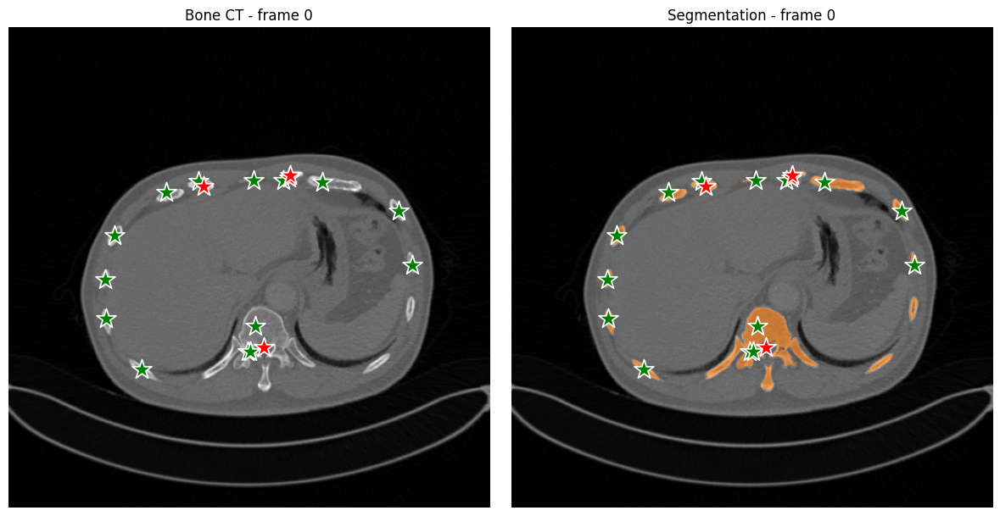

In [27]:
# Segment the vertebra (spine bone) in the bone CT images
# Add a positive click on the vertebra at frame 0
ann_frame_idx = 0
ann_obj_id = 1

# Click on the vertebra bone (center-bottom area)！！！！！！！
points = np.array([[262, 318], [141, 364], [103, 310], [102, 269], [112, 222], [167, 176], [260, 163], [292, 163], [333, 165], [415, 196], [429, 253], [254, 345], [257, 345], [271, 341], [298, 160], [299, 158], [202, 164], [207, 169]], dtype=np.float32)
labels = np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0], np.int32)

_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=bone_inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# Show the results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title(f"Bone CT - frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(bone_video_dir, bone_frame_names[ann_frame_idx])), cmap='gray')
show_points(points, labels, plt.gca(), marker_size=300)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f"Segmentation - frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(bone_video_dir, bone_frame_names[ann_frame_idx])), cmap='gray')
show_points(points, labels, plt.gca(), marker_size=300)
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])
plt.axis('off')

plt.tight_layout()

In [28]:
# Propagate the segmentation through the entire bone CT video sequence
bone_video_segments = {}
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(bone_inference_state):
    bone_video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

print(f"Propagated segmentation through {len(bone_video_segments)} frames")

propagate in video: 100%|███████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:01<00:00, 20.12it/s]

Propagated segmentation through 30 frames


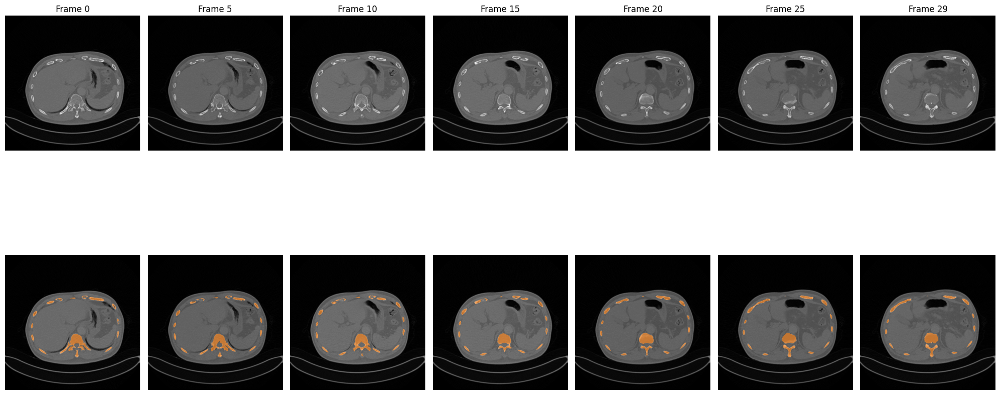

In [29]:
# Visualize segmentation results on multiple frames
vis_frame_indices = [0, 5, 10, 15, 20, 25, 29]

plt.figure(figsize=(20, 12))
for idx, frame_idx in enumerate(vis_frame_indices):
    # Original image
    plt.subplot(2, len(vis_frame_indices), idx + 1)
    plt.title(f"Frame {frame_idx}")
    plt.imshow(Image.open(os.path.join(bone_video_dir, bone_frame_names[frame_idx])), cmap='gray')
    plt.axis('off')
    
    # Segmentation overlay
    plt.subplot(2, len(vis_frame_indices), idx + 1 + len(vis_frame_indices))
    plt.imshow(Image.open(os.path.join(bone_video_dir, bone_frame_names[frame_idx])), cmap='gray')
    for out_obj_id, out_mask in bone_video_segments[frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)
    plt.axis('off')

plt.tight_layout()

In [30]:
# Save segmentation results
import cv2

output_dir = "./videos/bone_yanghailin_12_predictions"
os.makedirs(output_dir, exist_ok=True)

for frame_idx in range(len(bone_frame_names)):
    # Get the mask for this frame
    mask = bone_video_segments[frame_idx][1]  # obj_id = 1
    
    # Convert boolean mask to uint8
    mask_uint8 = (mask.squeeze() * 255).astype(np.uint8)
    
    # Save the mask
    output_path = os.path.join(output_dir, f"{frame_idx:05d}.png")
    cv2.imwrite(output_path, mask_uint8)

print(f"Saved {len(bone_frame_names)} segmentation masks to {output_dir}")

Saved 30 segmentation masks to ./videos/bone_yanghailin_12_predictions


FileNotFoundError: [Errno 2] No such file or directory: '/opt/data/private/hyp/sam2/notebooks/videos/bone_yanghailin_12_gt/00000.jpg'

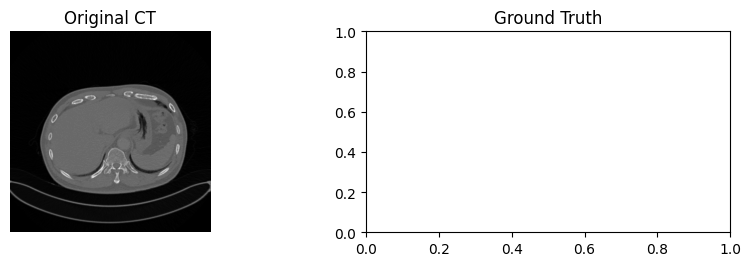

In [31]:
# Compare predictions with ground truth
gt_dir = "./videos/bone_yanghailin_12_gt"

# Visualize comparison for selected frames
comparison_frames = [0, 10, 20, 29]

plt.figure(figsize=(16, 12))
for idx, frame_idx in enumerate(comparison_frames):
    # Original image
    plt.subplot(len(comparison_frames), 3, idx * 3 + 1)
    if idx == 0:
        plt.title("Original CT")
    plt.imshow(Image.open(os.path.join(bone_video_dir, bone_frame_names[frame_idx])), cmap='gray')
    plt.ylabel(f"Frame {frame_idx}", fontsize=12)
    plt.axis('off')
    
    # Ground truth
    plt.subplot(len(comparison_frames), 3, idx * 3 + 2)
    if idx == 0:
        plt.title("Ground Truth")
    gt_img = Image.open(os.path.join(gt_dir, bone_frame_names[frame_idx]))
    plt.imshow(gt_img, cmap='gray')
    plt.axis('off')
    
    # Prediction
    plt.subplot(len(comparison_frames), 3, idx * 3 + 3)
    if idx == 0:
        plt.title("Prediction (SAM2 + LoRA)")
    mask = bone_video_segments[frame_idx][1]
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.axis('off')

plt.tight_layout()

## Propagate sparse masks for the Li Wan Qiang sequence

We have 1,800+ PNG frames in `data_LiWanQiang1125/images` and manually prepared masks every 10 frames in `data_LiWanQiang1125/mask_181`. The cells below turn those sparse masks into prompts for SAM 2 and propagate them to get dense per-frame segmentations.


In [32]:
from pathlib import Path

long_video_dir = "/opt/data/private/hyp/sam2/data_LiWanQiang1125/images"
long_mask_dir = "/opt/data/private/hyp/sam2/data_LiWanQiang1125/mask_1208_2"
valid_frame_exts = {".png", ".jpg", ".jpeg", ".PNG", ".JPG", ".JPEG"}


def parse_frame_idx(name: str) -> int:
    stem = Path(name).stem.replace("_mask", "")
    return int(stem.split("Img")[-1])


long_frame_paths = sorted(
    [p for p in Path(long_video_dir).iterdir() if p.suffix in valid_frame_exts],
    key=lambda p: parse_frame_idx(p.name),
)
long_frame_names = [p.name for p in long_frame_paths]
frame_name_to_idx = {name: idx for idx, name in enumerate(long_frame_names)}

long_mask_paths = sorted(
    [p for p in Path(long_mask_dir).iterdir() if p.suffix in valid_frame_exts],
    key=lambda p: parse_frame_idx(p.name),
)

print(f"Total frames: {len(long_frame_names)}")
print(f"Sparse masks: {len(long_mask_paths)}")
print(f"Frame range: {long_frame_names[0]} -> {long_frame_names[-1]}")


Total frames: 1852
Sparse masks: 465
Frame range: LI WAN QIANG.Ser7.Img0.png -> LI WAN QIANG.Ser7.Img1851.png


In [33]:
# Initialize a fresh inference state for the long sequence
# NOTE: SAM2 only supports JPEG folders here, so we convert PNGs to JPGs in a temp folder first.
from PIL import Image

long_video_jpg_dir = "/opt/data/private/hyp/sam2/data_LiWanQiang1125/images_jpg"
os.makedirs(long_video_jpg_dir, exist_ok=True)

# If the jpg folder is empty, create sequential JPG frames from the original PNGs
if len(os.listdir(long_video_jpg_dir)) == 0:
    print("Converting PNG frames to sequential JPGs for SAM2 ...")
    for idx, img_path in enumerate(long_frame_paths):
        img = Image.open(img_path).convert("RGB")
        out_path = os.path.join(long_video_jpg_dir, f"{idx:05d}.jpg")
        img.save(out_path, quality=95)
    print(f"Saved {len(long_frame_paths)} JPG frames to {long_video_jpg_dir}")
else:
    print(f"Reusing existing JPG frames in {long_video_jpg_dir}")

long_inference_state = predictor.init_state(video_path=long_video_jpg_dir)

Reusing existing JPG frames in /opt/data/private/hyp/sam2/data_LiWanQiang1125/images_jpg


frame loading (JPEG): 100%|█████████████████████████████████████████████████████████████████████████████████| 1852/1852 [01:07<00:00, 27.52it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 21.70 GiB. GPU 0 has a total capacity of 23.65 GiB of which 17.76 GiB is free. Process 4088194 has 5.88 GiB memory in use. Of the allocated memory 4.14 GiB is allocated by PyTorch, and 204.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [34]:
from tqdm.auto import tqdm

long_obj_id = 1  # propagate a single foreground structure across the study
mask_threshold = 127  # convert grayscale masks to binary

for mask_path in tqdm(long_mask_paths, desc="Adding sparse mask prompts"):
    frame_stem = mask_path.stem.replace("_mask", "")
    frame_name = f"{frame_stem}.png"
    if frame_name not in frame_name_to_idx:
        raise KeyError(f"Cannot find frame name for {mask_path}")
    frame_idx = frame_name_to_idx[frame_name]

    mask_arr = np.array(Image.open(mask_path).convert("L"))
    mask_bool = mask_arr > mask_threshold

    predictor.add_new_mask(
        inference_state=long_inference_state,
        frame_idx=frame_idx,
        obj_id=long_obj_id,
        mask=mask_bool,
    )

print(f"Attached {len(long_mask_paths)} mask prompts (every 10th frame)")


Adding sparse mask prompts:   0%|          | 0/465 [00:00<?, ?it/s]

NameError: name 'long_inference_state' is not defined

In [35]:
# Propagate masks through the whole long sequence
long_video_segments = {}
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(long_inference_state):
    long_video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

print(f"Propagated segmentation through {len(long_video_segments)} frames (expected ~{len(long_frame_names)})")


NameError: name 'long_inference_state' is not defined

In [36]:
# Save per-frame segmentation masks for the long sequence
import cv2

output_dir_long = "/opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2"
os.makedirs(output_dir_long, exist_ok=True)

for frame_idx, frame_name in enumerate(long_frame_names):
    if frame_idx not in long_video_segments:
        # if any frame is missing, you can debug here
        continue
    mask = long_video_segments[frame_idx][long_obj_id]
    mask_uint8 = (mask.squeeze() * 255).astype(np.uint8)
    out_name = Path(frame_name).with_suffix(".png").name
    out_path = os.path.join(output_dir_long, out_name)
    cv2.imwrite(out_path, mask_uint8)

print(f"Saved {len(long_video_segments)} predicted masks to {output_dir_long}")


Saved 0 predicted masks to /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2


## Chunked propagation for long sequence (avoid GPU OOM)

The cells below process the long Li Wan Qiang sequence in chunks of 300 frames:
for each chunk we build a temporary JPG folder, initialize SAM2 on that subset,
add the sparse masks that fall inside the chunk, propagate within the chunk, and
immediately save the predicted masks to disk.


In [37]:
# Process the long sequence in chunks to avoid GPU OOM
from tqdm.auto import tqdm

chunk_size = 300
output_dir_long_chunked = "/opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked"
os.makedirs(output_dir_long_chunked, exist_ok=True)

# Pre-compute mapping: global frame index -> list of mask paths
from collections import defaultdict

global_idx_to_masks = defaultdict(list)
for mp in long_mask_paths:
    frame_stem = mp.stem.replace("_mask", "")
    frame_name = f"{frame_stem}.png"
    gi = frame_name_to_idx.get(frame_name, None)
    if gi is not None:
        global_idx_to_masks[gi].append(mp)

chunk_jpg_dir = "/opt/data/private/hyp/sam2/data_LiWanQiang1125/images_jpg_chunk"
os.makedirs(chunk_jpg_dir, exist_ok=True)

for chunk_start in range(0, len(long_frame_paths), chunk_size):
    chunk_end = min(len(long_frame_paths), chunk_start + chunk_size)
    print(f"\n=== Processing chunk {chunk_start}–{chunk_end-1} ===")

    # Clear old JPGs in the chunk folder
    for f in os.listdir(chunk_jpg_dir):
        os.remove(os.path.join(chunk_jpg_dir, f))

    # Export this chunk's PNGs to sequential JPGs 00000.jpg, 00001.jpg, ...
    for local_idx, global_idx in enumerate(range(chunk_start, chunk_end)):
        img_path = long_frame_paths[global_idx]
        img = Image.open(img_path).convert("RGB")
        out_path = os.path.join(chunk_jpg_dir, f"{local_idx:05d}.jpg")
        img.save(out_path, quality=95)

    # Initialize SAM2 state for this chunk (offload frames to CPU to save GPU memory)
    chunk_state = predictor.init_state(video_path=chunk_jpg_dir, offload_video_to_cpu=True)

    # Add sparse masks that fall inside this chunk
    for global_idx in range(chunk_start, chunk_end):
        if global_idx not in global_idx_to_masks:
            continue
        local_idx = global_idx - chunk_start
        for mp in global_idx_to_masks[global_idx]:
            mask_arr = np.array(Image.open(mp).convert("L"))
            mask_bool = mask_arr > mask_threshold
            predictor.add_new_mask(
                inference_state=chunk_state,
                frame_idx=local_idx,
                obj_id=long_obj_id,
                mask=mask_bool,
            )

    # Propagate within this chunk
    chunk_segments = {}
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(chunk_state):
        chunk_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

    # Save masks for this chunk
    for local_idx in range(chunk_end - chunk_start):
        global_idx = chunk_start + local_idx
        if local_idx not in chunk_segments:
            continue
        if long_obj_id not in chunk_segments[local_idx]:
            continue
        mask = chunk_segments[local_idx][long_obj_id]
        mask_uint8 = (mask.squeeze() * 255).astype(np.uint8)
        out_name = Path(long_frame_names[global_idx]).with_suffix(".png").name
        out_path = os.path.join(output_dir_long_chunked, out_name)
        cv2.imwrite(out_path, mask_uint8)

    print(f"Saved masks for frames {chunk_start}–{chunk_end-1} into {output_dir_long_chunked}")



=== Processing chunk 0–299 ===


propagate in video: 100%|███████████████████████████████████████████████████████████████| 300/300 [00:23<00:00, 12.75it/s]


Saved masks for frames 0–299 into /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked

=== Processing chunk 300–599 ===


propagate in video: 100%|███████████████████████████████████████████████████████████████| 300/300 [00:23<00:00, 12.70it/s]


Saved masks for frames 300–599 into /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked

=== Processing chunk 600–899 ===


propagate in video: 100%|███████████████████████████████████████████████████████████████| 300/300 [00:19<00:00, 15.18it/s]


Saved masks for frames 600–899 into /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked

=== Processing chunk 900–1199 ===


propagate in video: 100%|███████████████████████████████████████████████████████████████| 300/300 [00:23<00:00, 12.99it/s]


Saved masks for frames 900–1199 into /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked

=== Processing chunk 1200–1499 ===


propagate in video: 100%|███████████████████████████████████████████████████████████████| 300/300 [00:19<00:00, 15.57it/s]


Saved masks for frames 1200–1499 into /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked

=== Processing chunk 1500–1799 ===


propagate in video: 100%|███████████████████████████████████████████████████████████████| 300/300 [00:22<00:00, 13.06it/s]


Saved masks for frames 1500–1799 into /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked

=== Processing chunk 1800–1851 ===


propagate in video: 100%|█████████████████████████████████████████████████████████████████| 52/52 [00:02<00:00, 20.86it/s]

Saved masks for frames 1800–1851 into /opt/data/private/hyp/sam2/data_LiWanQiang1125/pred_masks_sam2_chunked
